In [1]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [2]:
np.random.seed(42)

In [3]:
cluster_generator = CorrelatedClusterGenerator(n_samples=10000,n_features=20,n_clusters=7,correlation=0.8,random_state=42)

In [4]:
X, y = cluster_generator.generate_clusters()

In [5]:
X = X + np.random.normal(scale=3,size=X.shape) 

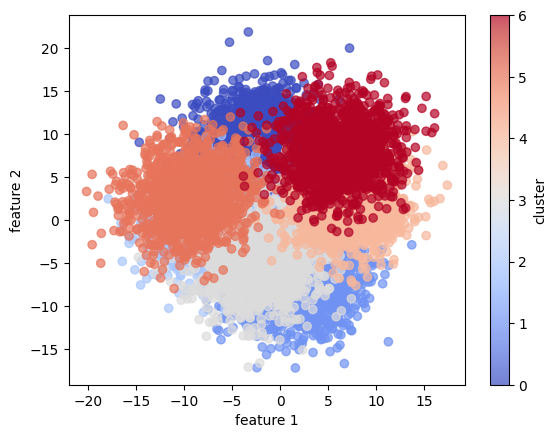

In [6]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

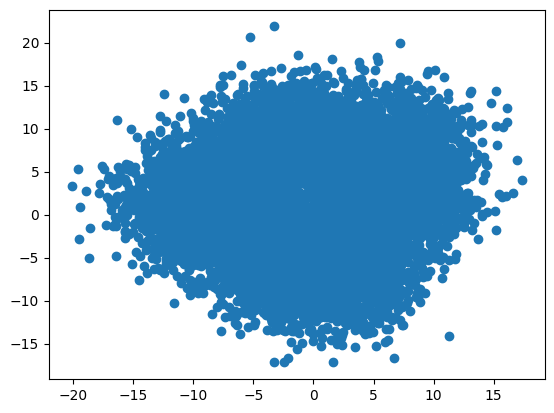

In [7]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [8]:
corr_dataset = pd.DataFrame(X) 

In [9]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [10]:
corr_dataset['target'] = y

In [11]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.975791,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,5.243545,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,4.630809,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,11.734587,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.010050,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-6.742334,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-3.284881,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-1.025745,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-5.191422,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6


In [12]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [13]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,0.086283,0.053382,-0.623714,-0.327511,0.057646,0.444622,0.047022,0.166653,0.195096,-0.235168,-0.019446,-0.394378,-0.294573,0.392681,-0.397996,0.003732,0.405220,-0.254579,0.128030
vab_2,0.086283,1.000000,0.065893,-0.031857,-0.130179,-0.529942,0.302360,0.402249,-0.022720,0.167973,-0.488083,0.380788,0.383597,-0.635561,-0.329846,-0.534125,-0.001971,0.650134,-0.072344,0.324755
vab_3,0.053382,0.065893,1.000000,-0.131809,-0.162632,-0.236677,-0.325825,0.420241,-0.182153,0.656979,-0.209296,0.006873,-0.249534,-0.248630,-0.274736,-0.320990,0.348000,0.025693,0.134697,-0.226004
vab_4,-0.623714,-0.031857,-0.131809,1.000000,0.071517,0.134811,-0.440839,-0.123813,0.095343,-0.185069,0.344643,0.324979,0.433816,0.257937,-0.386200,0.334662,-0.337258,-0.252631,0.030841,-0.124273
vab_5,-0.327511,-0.130179,-0.162632,0.071517,1.000000,-0.034432,0.043560,-0.033359,-0.096523,-0.431647,-0.027884,-0.383651,0.197336,0.379202,0.145398,0.439730,0.376127,-0.277865,0.563567,0.134392
vab_6,0.057646,-0.529942,-0.236677,0.134811,-0.034432,1.000000,-0.089941,-0.342286,0.004175,-0.195250,0.619113,-0.222196,-0.365486,0.511966,0.418515,0.438643,-0.229874,-0.328247,-0.055523,0.014401
vab_7,0.444622,0.302360,-0.325825,-0.440839,0.043560,-0.089941,1.000000,0.061980,-0.039230,-0.103078,-0.143277,-0.105590,0.014148,-0.175646,0.421982,-0.128060,0.153225,0.428386,-0.193003,0.395836
vab_8,0.047022,0.402249,0.420241,-0.123813,-0.033359,-0.342286,0.061980,1.000000,-0.309859,0.416465,-0.259046,-0.006406,-0.043304,-0.374158,-0.167956,-0.348779,0.329584,0.327595,0.145076,0.195464
vab_9,0.166653,-0.022720,-0.182153,0.095343,-0.096523,0.004175,-0.039230,-0.309859,1.000000,-0.205439,-0.230779,0.545006,0.416312,0.016437,-0.158717,-0.016969,-0.375589,-0.001893,-0.278398,-0.410949
vab_10,0.195096,0.167973,0.656979,-0.185069,-0.431647,-0.195250,-0.103078,0.416465,-0.205439,1.000000,-0.081978,0.151656,-0.256553,-0.348696,-0.224841,-0.402834,0.250327,0.185607,-0.261651,-0.235505


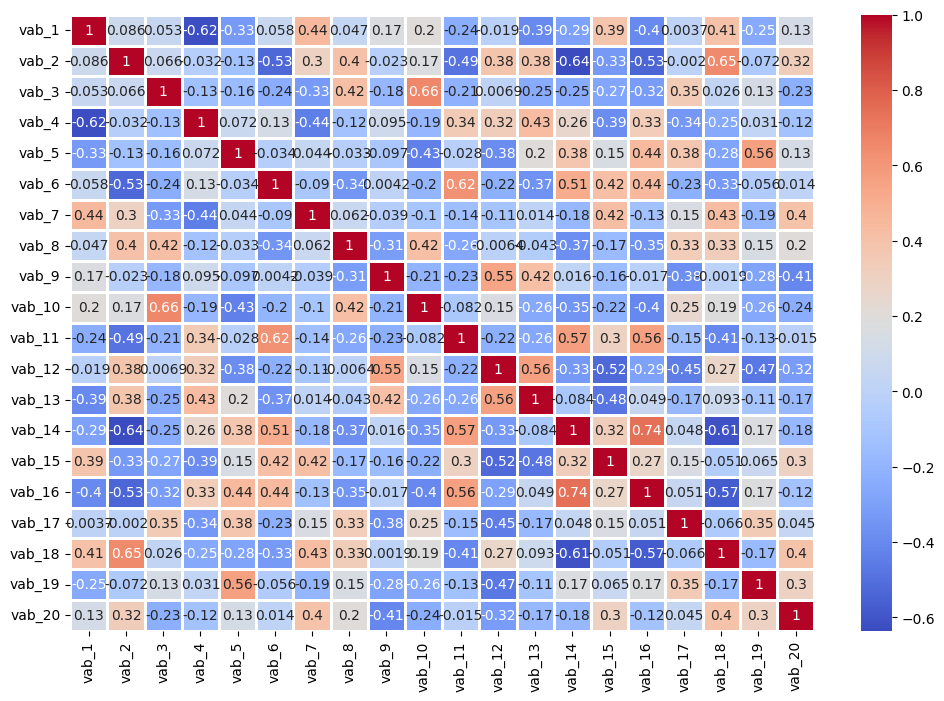

In [14]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [15]:
X_values = corr_dataset.iloc[:,:-1].values

In [16]:
y_values = corr_dataset.iloc[:,-1].values

In [17]:
scaler = StandardScaler()

In [18]:
X_values = scaler.fit_transform(X_values)

In [19]:
np.mean(X_values),np.std(X_values)

(2.4082821015958576e-16, 1.0000000000000002)

In [20]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.195314,0.189106,1.927523,-0.437091,-0.464907,-1.444736,-2.015127,-0.286090,0.263883,0.609381,-0.917117,1.226509,0.867606,-2.719353,-1.886780,-1.096343,-0.912049,0.092360,-0.447663,-1.059477
1,-1.038561,2.127985,0.582718,0.270926,-1.617300,0.177271,-0.791489,1.203460,0.347718,0.793806,-1.781742,0.844044,1.157132,-1.601496,-1.523613,-1.713875,-1.064991,0.094155,-0.319994,-1.161452
2,-0.004005,1.121804,0.316224,-0.004671,-1.644022,-0.476932,-0.615192,1.263957,0.858632,0.851711,-0.930050,0.758271,0.627489,-1.223724,-1.321501,-1.648134,-1.207002,0.801629,0.119492,-0.242592
3,-0.514347,1.336590,1.731629,1.020058,-0.103050,-0.892963,-1.038820,0.055419,0.511063,0.940776,-1.673510,1.752674,0.454410,-1.039936,-1.908458,-1.954453,-0.195820,1.125137,0.606349,-0.801278
4,0.510938,1.170958,0.475384,-0.080543,-0.958326,-2.031096,-0.805208,1.019574,0.595839,0.527278,-1.608715,1.091323,0.790872,-1.249654,-1.877428,-2.026067,-0.049670,0.448599,0.129805,-0.037897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,1.433236,1.331115,-0.302538,-1.131008,0.244495,1.211134,1.428822,1.548100,-0.901641,0.841700,0.404882,-0.833766,-0.638432,-1.838547,0.336174,-1.306420,0.530074,1.728424,0.107265,1.188988
9992,1.537532,0.953304,0.603367,0.013833,-0.369184,-0.240399,1.243155,0.011176,-0.788246,0.007062,0.325225,-0.349785,-1.734190,-0.863752,1.245360,-0.152893,-0.682407,1.982440,0.466566,2.131202
9993,1.292287,1.872004,0.678928,-1.317549,-0.734472,-0.471638,1.386699,1.707339,-1.533203,-0.263261,-0.157911,-0.033546,-0.651676,-0.451882,1.765097,-0.650733,0.106330,1.237864,-0.044524,2.370823
9994,1.104536,0.900385,0.149562,-0.275153,-0.083168,0.500895,0.605486,1.463031,-1.459661,-0.099419,-0.259677,-0.616666,-0.786295,-1.233124,-0.129246,-1.084859,-0.107677,0.120243,-0.943236,1.516122


<Axes: ylabel='Density'>

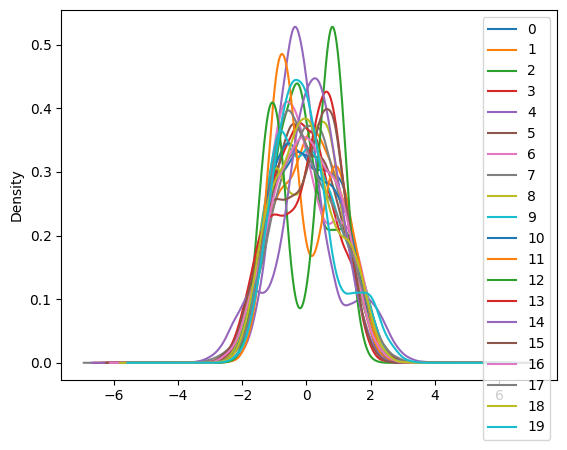

In [21]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [22]:
pca_general = PCA()

In [23]:
pca_general.fit(X_values)

PCA()

In [24]:
explained_variance = pca_general.explained_variance_ratio_

In [25]:
explained_variance

array([0.25085863, 0.17631711, 0.13288604, 0.12110532, 0.07449821,
       0.04976508, 0.03280681, 0.02140169, 0.01577348, 0.01403131,
       0.01371896, 0.0126769 , 0.01198942, 0.01165644, 0.01153166,
       0.01114296, 0.01032075, 0.0100248 , 0.00956051, 0.00793391])

In [26]:
eigenvalues = pca_general.explained_variance_

In [27]:
pd.DataFrame(eigenvalues)

,0
0,5.017675
1,3.526695
2,2.657987
3,2.422349
4,1.490113
5,0.995401
6,0.656202
7,0.428077
8,0.315501
9,0.280654


In [28]:
eigenvectors = pca_general.components_

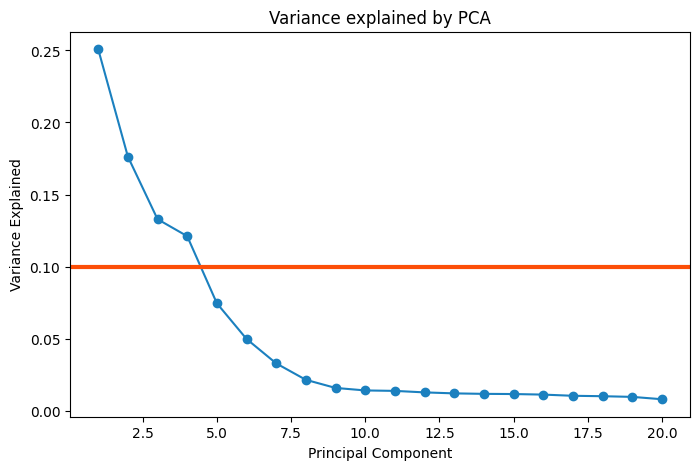

In [29]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [30]:
pca = PCA(n_components=5)

In [31]:
principal_components = pca.fit_transform(X_values)

In [32]:
pd.DataFrame(principal_components).head(8)

,0,1,2,3,4
0,-3.144209,2.439484,-1.485679,1.502114,0.639784
1,-3.537619,2.474943,-0.917701,0.640718,-0.571859
2,-3.328275,1.610779,-0.150231,0.627070,-0.604350
3,-3.514386,2.308259,-1.936754,0.449113,0.170440
4,-4.072544,1.484024,-1.145132,-0.026082,0.452053
5,-3.276300,1.670141,-1.253959,0.181603,-0.438020
6,-3.714366,1.635275,-1.191061,-0.220613,-0.186056
7,-3.240986,2.003964,-1.157888,0.872203,-0.550024


In [33]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3','principal component 4','principal component 5'])

In [34]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [35]:
final_df

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,target
0,-3.144209,2.439484,-1.485679,1.502114,0.639784,0
1,-3.537619,2.474943,-0.917701,0.640718,-0.571859,0
2,-3.328275,1.610779,-0.150231,0.627070,-0.604350,0
3,-3.514386,2.308259,-1.936754,0.449113,0.170440,0
4,-4.072544,1.484024,-1.145132,-0.026082,0.452053,0
...,...,...,...,...,...,...
9991,-2.506079,-3.050695,0.957791,-0.411379,-1.413688,6
9992,-1.512154,-2.714885,1.532536,-0.565302,-1.827190,6
9993,-2.499298,-3.365884,0.972416,-1.002993,-1.656612,6
9994,-1.778516,-1.936206,0.428869,-0.061831,-1.629409,6


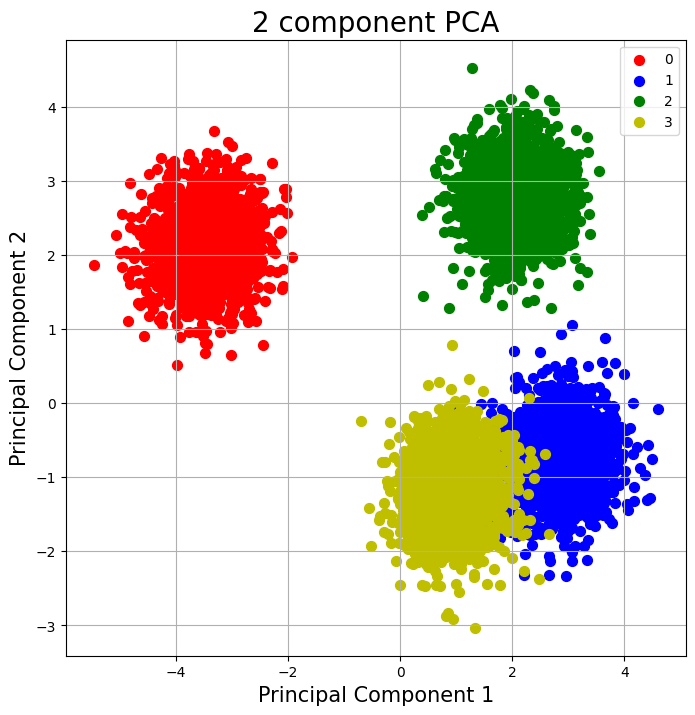

In [36]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

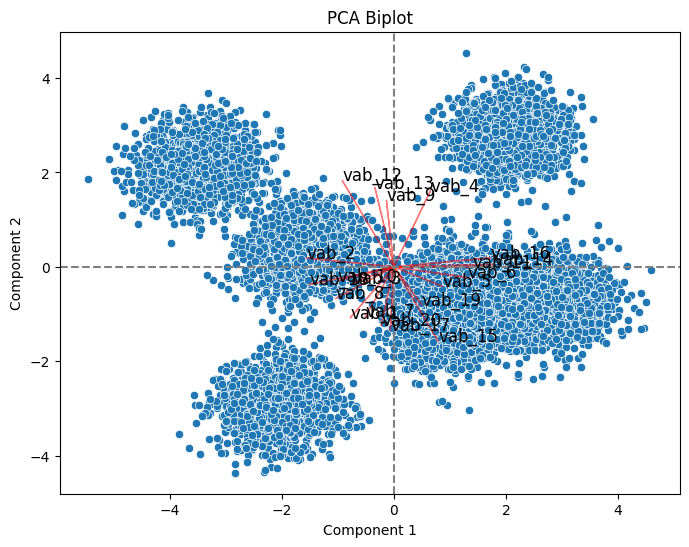

In [37]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

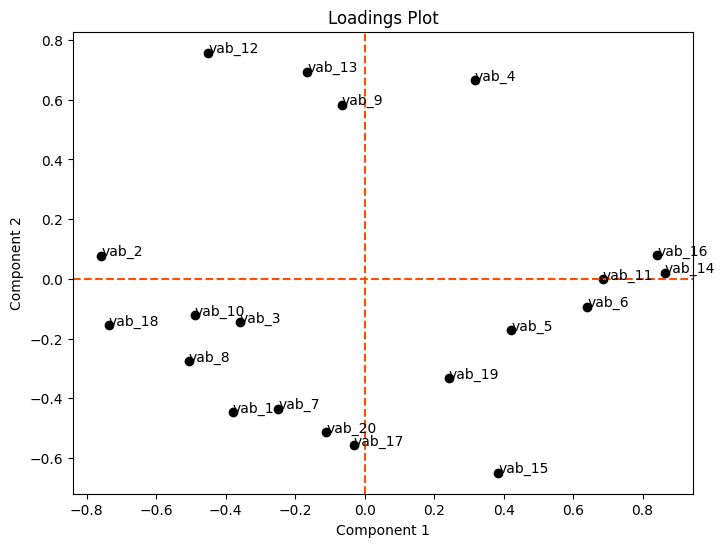

In [38]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [39]:
X_pca = pca.transform(X_values)

In [40]:
pd.DataFrame(X_pca).head()

,0,1,2,3,4
0,-3.144209,2.439484,-1.485679,1.502114,0.639784
1,-3.537619,2.474943,-0.917701,0.640718,-0.571859
2,-3.328275,1.610779,-0.150231,0.627070,-0.604350
3,-3.514386,2.308259,-1.936754,0.449113,0.170440
4,-4.072544,1.484024,-1.145132,-0.026082,0.452053


## t-SNE

In [41]:
tsne = TSNE(n_components=3,random_state=42)

In [42]:
X_tsne = tsne.fit_transform(X_values)

In [43]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [44]:
tsne_data

,dim_1,dim_2,dim_3,target
0,-13.354081,22.454405,1.204159,0
1,-19.099482,21.957712,-2.986934,0
2,-20.293339,11.811953,-7.165609,0
3,-21.020205,0.265859,-3.990270,0
4,-18.981401,15.400050,-10.781475,0
...,...,...,...,...
9991,-9.284533,-12.522317,5.612980,6
9992,-12.973588,-6.760881,5.268881,6
9993,-8.605593,-9.087533,-1.324507,6
9994,2.404562,-21.735233,9.309764,6


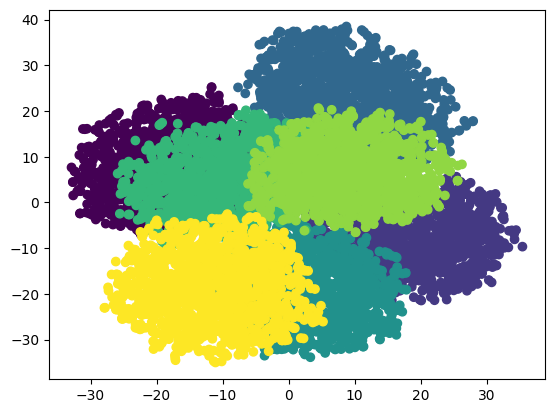

In [45]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [46]:
tsne.kl_divergence_

2.3976800441741943

## umap

In [47]:
umap = umap.UMAP(n_components=3,random_state=42)

In [48]:
X_umap = umap.fit_transform(X_values)

In [49]:
X_umap

array([[ 7.9888587,  1.6401206, 16.32906  ],
       [ 8.152814 ,  1.7409277, 16.82158  ],
       [ 8.129381 ,  2.1905587, 16.905758 ],
       ...,
       [ 8.267254 ,  1.0697683, -6.510482 ],
       [ 8.5446825,  1.6337082, -6.97909  ],
       [ 7.871666 ,  1.6628731, -7.1928287]], dtype=float32)

In [50]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [51]:
umap_data

,dim_1,dim_2,dim_3,target
0,7.988859,1.640121,16.329060,0
1,8.152814,1.740928,16.821581,0
2,8.129381,2.190559,16.905758,0
3,8.502430,2.542628,16.101667,0
4,7.598228,1.939652,16.538818,0
...,...,...,...,...
9991,8.148811,1.648117,-6.392191,6
9992,7.516783,1.350301,-6.453392,6
9993,8.267254,1.069768,-6.510482,6
9994,8.544683,1.633708,-6.979090,6


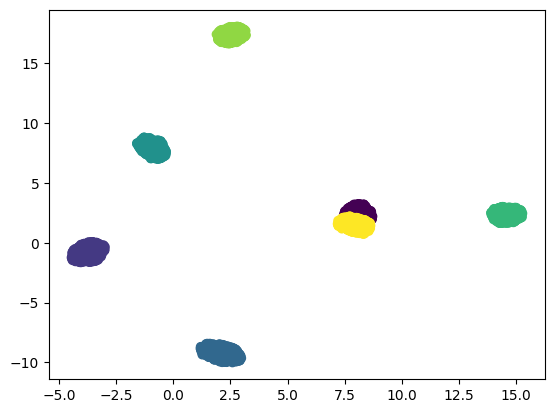

In [52]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [53]:
kmeans = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [54]:
kmeans.fit(X_values)

KMeans(n_clusters=7, random_state=42)

In [55]:
df_kmeans = corr_dataset.copy()

In [56]:
df_kmeans['k_means'] = kmeans.labels_

In [57]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,1
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,1
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,1
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,1


In [58]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


In [59]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


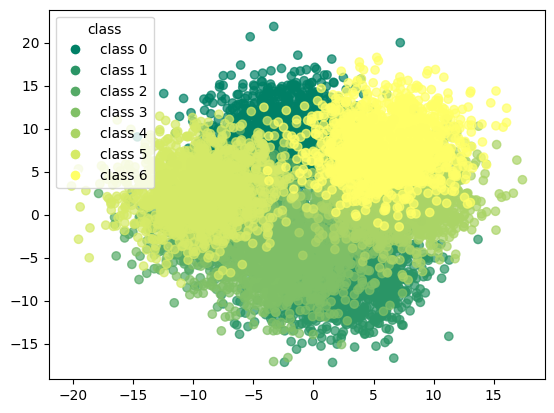

In [60]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

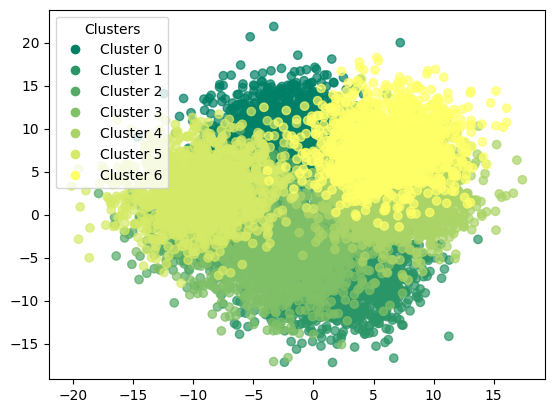

In [61]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [62]:
kmeans.cluster_centers_

array([[-0.97881092, -0.23290904, -1.23706304,  1.56837565, -0.37243025,
         0.8252566 , -0.19738541, -0.88108497,  0.38636707, -0.66978953,
         1.42570146,  0.90576548,  0.96222939,  0.77135713, -0.2836155 ,
         0.98197065, -1.33938507, -0.43558219, -1.07857755, -0.24694799],
       [ 1.04279897,  1.00991782, -0.27824637, -0.98290614, -0.50493826,
        -0.0996438 ,  1.40889632,  0.70371768, -1.22111398,  0.22858792,
        -0.10050819, -0.65639463, -0.91334329, -1.00617845,  0.89115668,
        -0.94336239,  0.15381958,  1.44476317, -0.10707371,  1.80786861],
       [-0.24753019,  1.17167914,  1.07679925,  0.58904683, -0.7622477 ,
        -1.09320322, -1.03473737,  0.73839301,  0.52888564,  0.77540071,
        -1.23090916,  1.41791366,  0.7296227 , -1.41802575, -1.74147483,
        -1.4088781 , -0.58345645,  0.7646237 ,  0.08049759, -0.31853619],
       [-1.27340585,  0.21751297, -0.3023926 ,  0.3158541 ,  1.89259386,
        -0.76394496,  0.10101766,  0.2460377 , -

In [63]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [64]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### k-means with pca

In [65]:
kmeans_pca = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [66]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=7, random_state=42)

In [67]:
df_pca_kmeans = corr_dataset.copy()

In [68]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [69]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,4
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,4
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,4
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,4


In [70]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [71]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


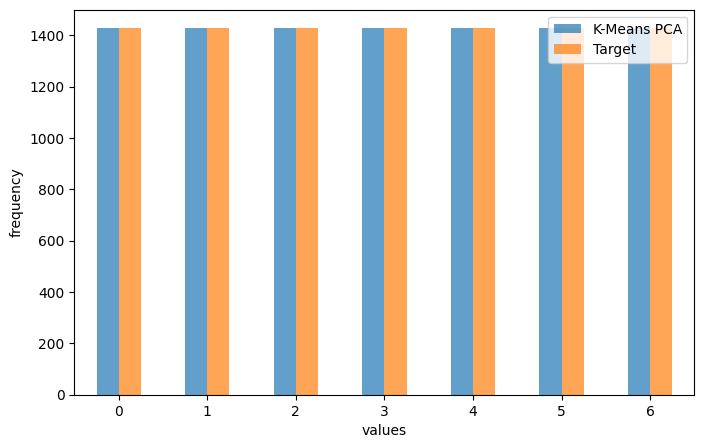

In [72]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [73]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [74]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



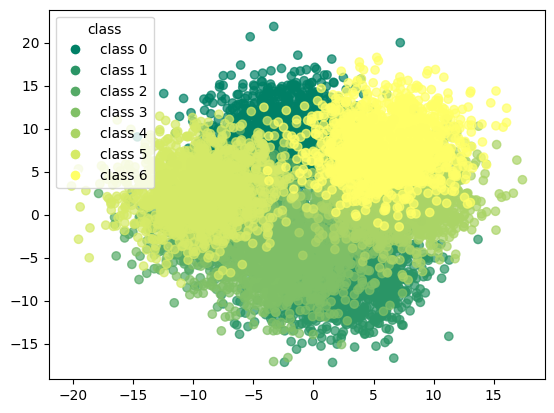

In [75]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

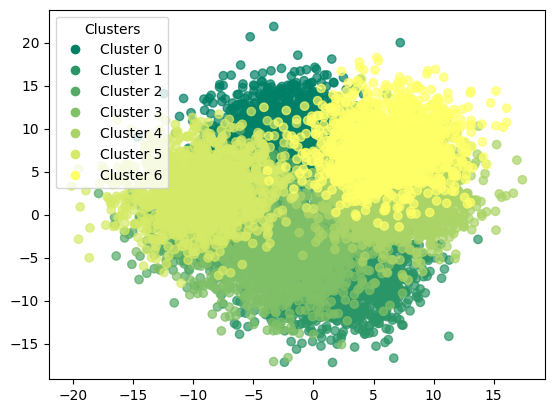

In [76]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

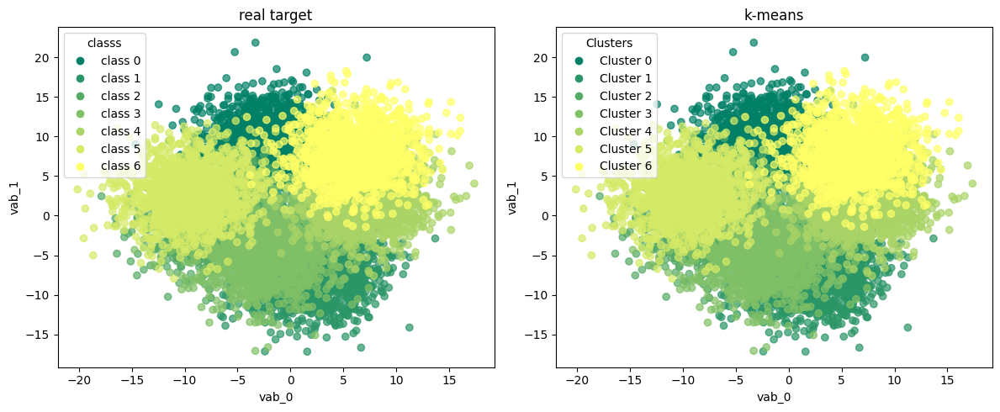

In [77]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

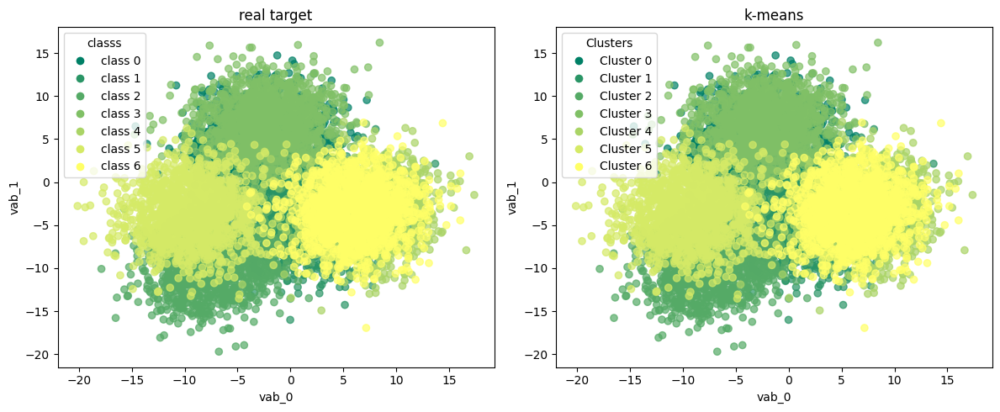

In [78]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

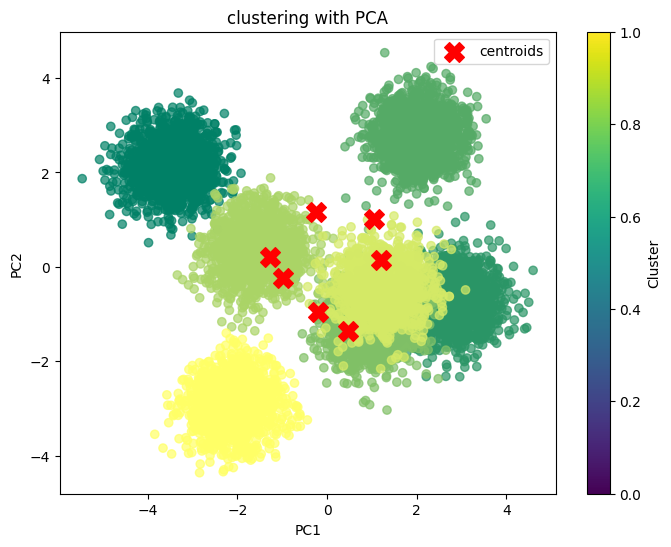

In [79]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

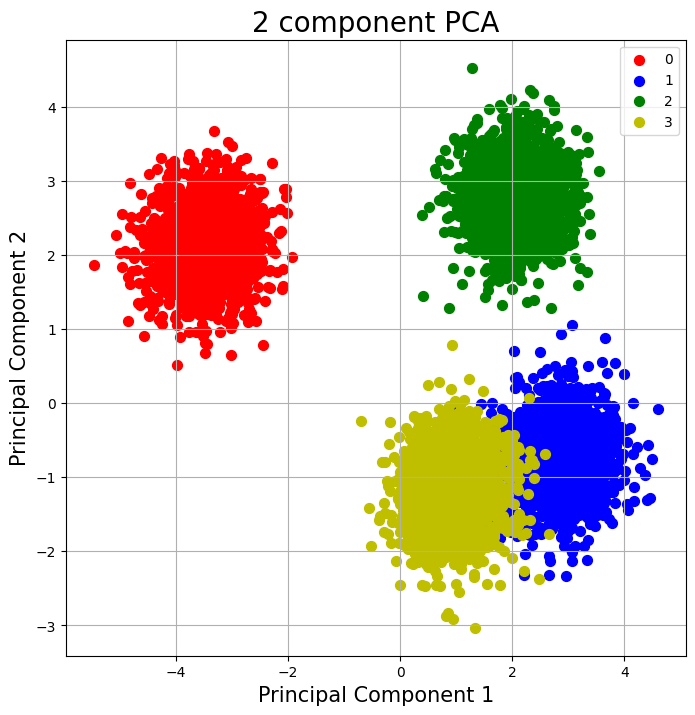

In [80]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [81]:
kmeans_tsne = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [82]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=7, random_state=42)

In [83]:
df_tsne_kmeans = corr_dataset.copy()

In [84]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [85]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,1
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,1
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,1
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,1


In [86]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.00010004001600640257
accuracy after: 0.9992997198879552


In [87]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


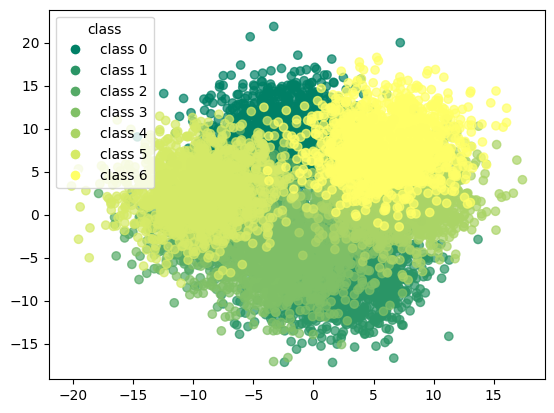

In [88]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

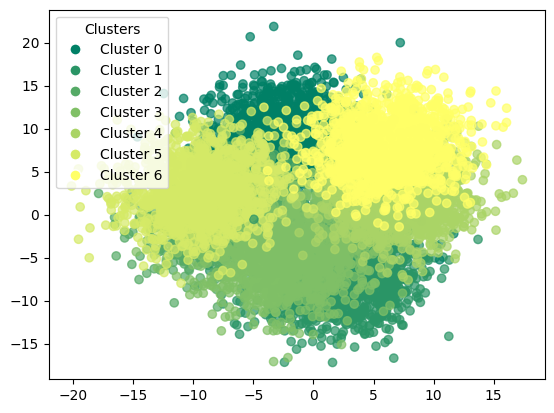

In [89]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

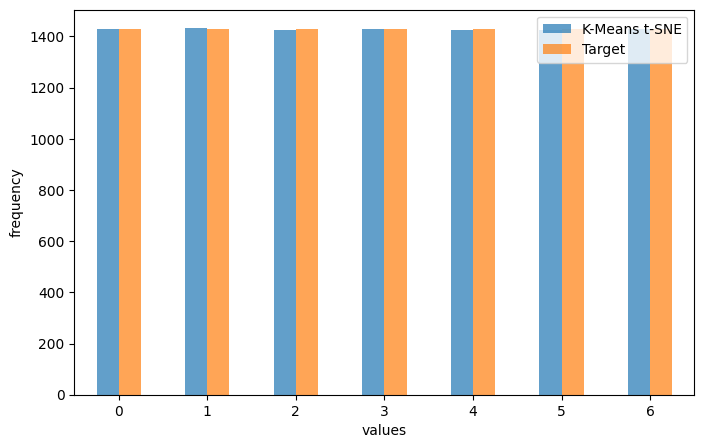

In [90]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [91]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    4 1424    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   2    0    0    0 1426    0    0]
 [   0    1    0    0    0 1427    0]
 [   0    0    0    0    0    0 1428]]


In [92]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### k-means with umap

In [93]:
kmeans_umap = KMeans(n_clusters=7,init='k-means++',random_state=42)

In [94]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=7, random_state=42)

In [95]:
df_umap_kmeans = corr_dataset.copy()

In [96]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [97]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,3
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,3
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,3
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,3


In [98]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


In [99]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


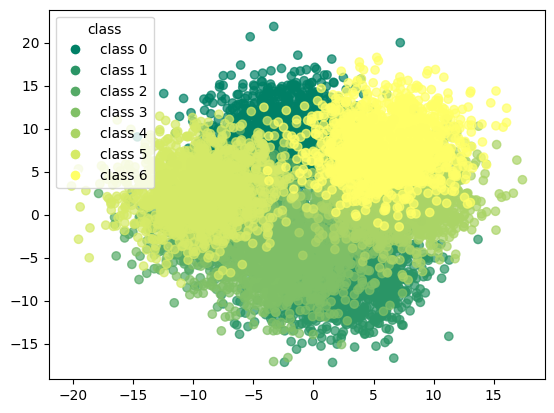

In [100]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

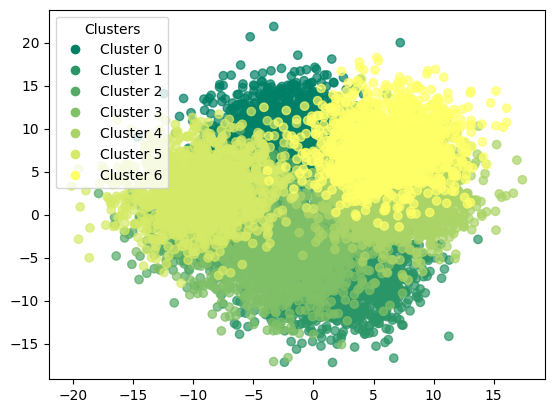

In [101]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

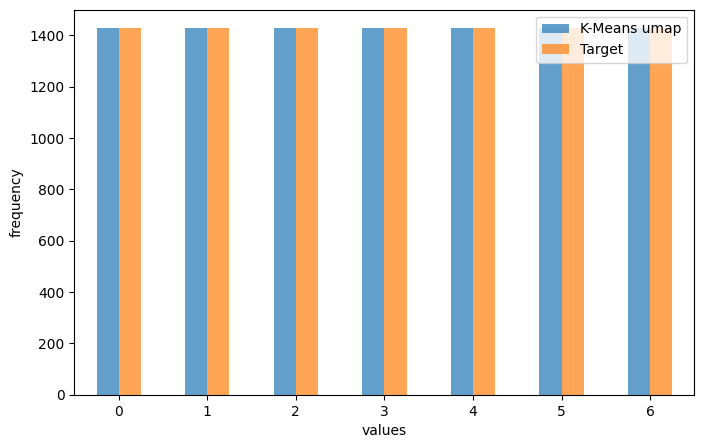

In [102]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [103]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [104]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



## trimmed k-means

In [105]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [106]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=7,trim_fraction=0.1)

In [107]:
trimmed_kmeans

KMeans(n_clusters=7, random_state=42)

In [108]:
df_trim_kmeans = corr_dataset.copy()

In [109]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [110]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [111]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
5,-1.032610,8.619632,8.515254,4.999066,-5.386016,-5.941507,-5.423943,6.479629,4.773576,6.445483,...,6.909954,-0.843130,-2.416090,-8.833184,-1.898121,2.656074,4.142804,0.737767,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,4
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,4
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,4
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,4


In [112]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [113]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
5,-1.032610,8.619632,8.515254,4.999066,-5.386016,-5.941507,-5.423943,6.479629,4.773576,6.445483,...,6.909954,-0.843130,-2.416090,-8.833184,-1.898121,2.656074,4.142804,0.737767,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


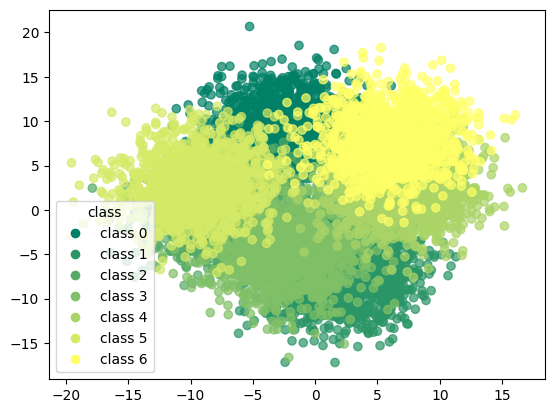

In [114]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

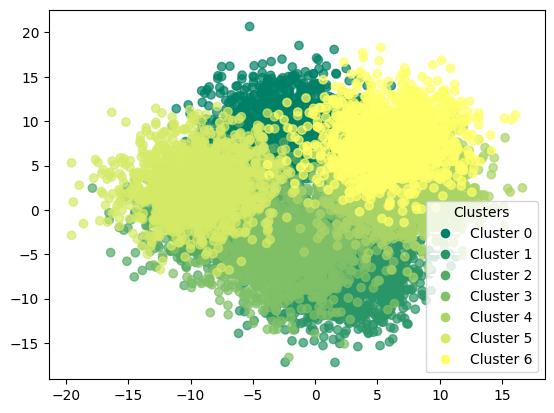

In [115]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [116]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1296    0    0    0    0    0    0]
 [   0 1270    0    0    0    0    0]
 [   0    0 1283    0    0    0    0]
 [   0    0    0 1282    0    0    0]
 [   0    0    0    0 1284    0    0]
 [   0    0    0    0    0 1292    0]
 [   0    0    0    0    0    0 1289]]


In [117]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1296
           1       1.00      1.00      1.00      1270
           2       1.00      1.00      1.00      1283
           3       1.00      1.00      1.00      1282
           4       1.00      1.00      1.00      1284
           5       1.00      1.00      1.00      1292
           6       1.00      1.00      1.00      1289

    accuracy                           1.00      8996
   macro avg       1.00      1.00      1.00      8996
weighted avg       1.00      1.00      1.00      8996



### trimmed k-means with pca

In [118]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=7,trim_fraction=0.1)

In [119]:
trim_kmeans_pca

KMeans(n_clusters=7, random_state=42)

In [120]:
df_pca_trim_kmeans = corr_dataset.copy()

In [121]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [122]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [123]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
5,-1.032610,8.619632,8.515254,4.999066,-5.386016,-5.941507,-5.423943,6.479629,4.773576,6.445483,...,6.909954,-0.843130,-2.416090,-8.833184,-1.898121,2.656074,4.142804,0.737767,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,4
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,4
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,4
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,4


In [124]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.0
accuracy after: 0.9924410849266341


In [125]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
5,-1.032610,8.619632,8.515254,4.999066,-5.386016,-5.941507,-5.423943,6.479629,4.773576,6.445483,...,6.909954,-0.843130,-2.416090,-8.833184,-1.898121,2.656074,4.142804,0.737767,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


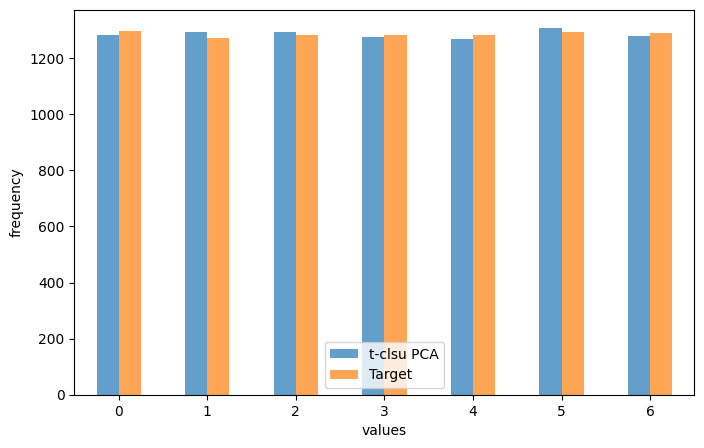

In [126]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [127]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1281   15    0    0    0    0    0]
 [   0 1270    0    0    0    0    0]
 [   0    8 1275    0    0    0    0]
 [   0    0   18 1264    0    0    0]
 [   0    0    0   12 1268    4    0]
 [   0    0    0    0    0 1292    0]
 [   0    0    0    0    0   11 1278]]


In [128]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1296
           1       0.98      1.00      0.99      1270
           2       0.99      0.99      0.99      1283
           3       0.99      0.99      0.99      1282
           4       1.00      0.99      0.99      1284
           5       0.99      1.00      0.99      1292
           6       1.00      0.99      1.00      1289

    accuracy                           0.99      8996
   macro avg       0.99      0.99      0.99      8996
weighted avg       0.99      0.99      0.99      8996



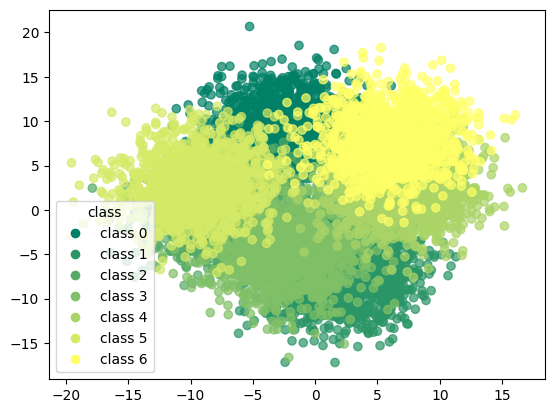

In [129]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

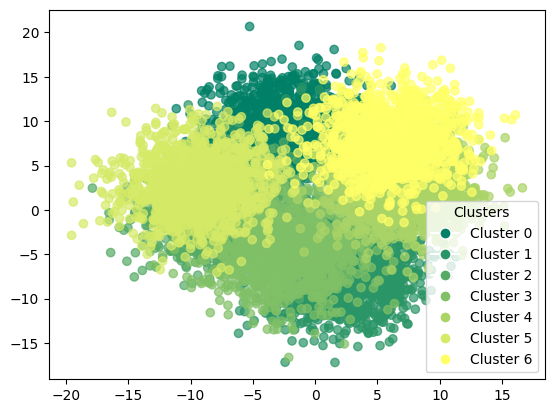

In [130]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

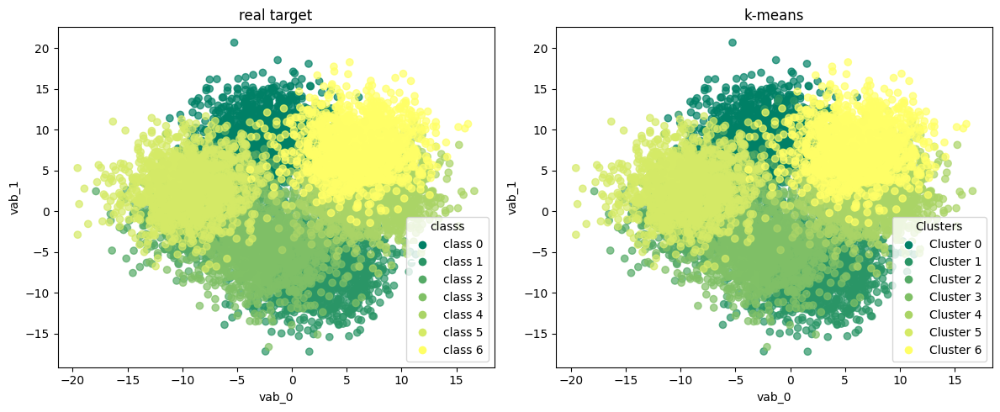

In [131]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

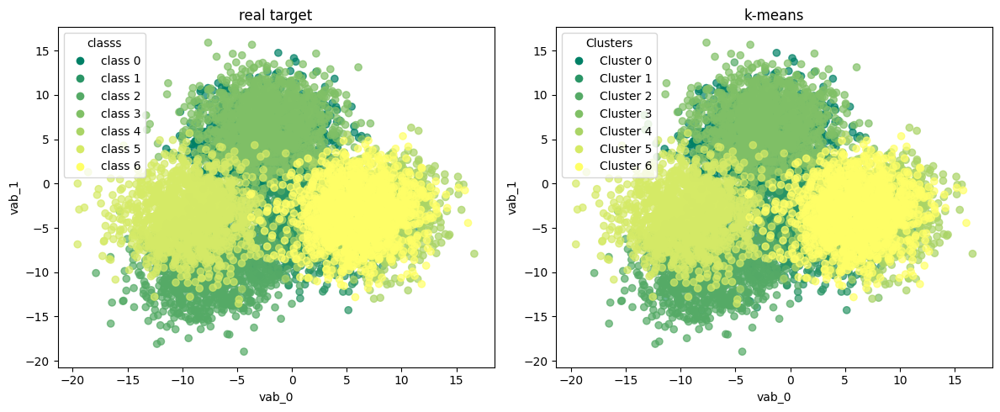

In [132]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [133]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=7,trim_fraction=0.1)

In [134]:
trim_kmeans_tsne

KMeans(n_clusters=7, random_state=42)

In [135]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [136]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [137]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [138]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,5
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,5
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,5
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,5
5,-1.032610,8.619632,8.515254,4.999066,-5.386016,-5.941507,-5.423943,6.479629,4.773576,6.445483,...,6.909954,-0.843130,-2.416090,-8.833184,-1.898121,2.656074,4.142804,0.737767,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,1
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,1
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,1
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,1


In [139]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.14384170742552246
accuracy after: 0.9791018230324589


In [140]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
5,-1.032610,8.619632,8.515254,4.999066,-5.386016,-5.941507,-5.423943,6.479629,4.773576,6.445483,...,6.909954,-0.843130,-2.416090,-8.833184,-1.898121,2.656074,4.142804,0.737767,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


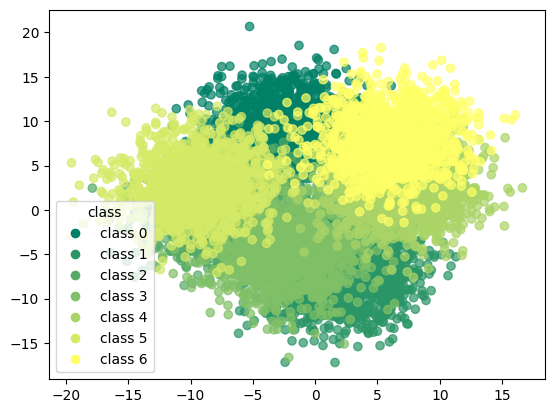

In [141]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

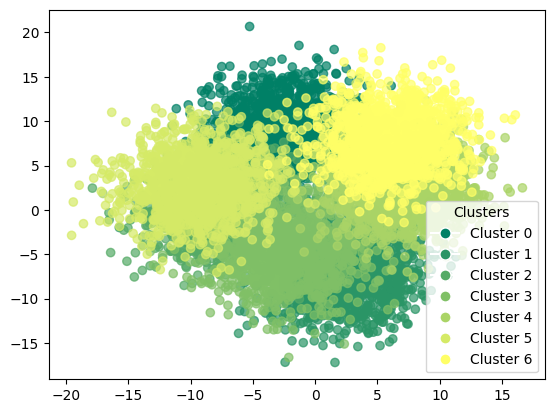

In [142]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

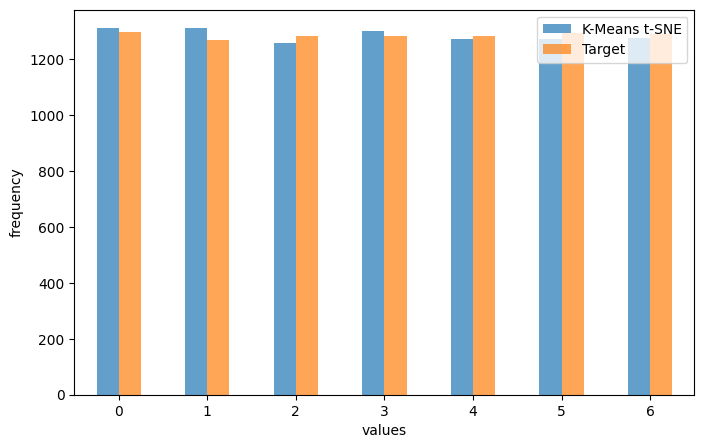

In [143]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [144]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[1296    0    0    0    0    0    0]
 [  14 1256    0    0    0    0    0]
 [   0   55 1228    0    0    0    0]
 [   0    0   28 1254    0    0    0]
 [   0    0    0   45 1239    0    0]
 [   0    0    0    0   33 1259    0]
 [   0    0    0    0    0   13 1276]]


In [145]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1296
           1       0.96      0.99      0.97      1270
           2       0.98      0.96      0.97      1283
           3       0.97      0.98      0.97      1282
           4       0.97      0.96      0.97      1284
           5       0.99      0.97      0.98      1292
           6       1.00      0.99      0.99      1289

    accuracy                           0.98      8996
   macro avg       0.98      0.98      0.98      8996
weighted avg       0.98      0.98      0.98      8996



### trimmed k-means with umap

In [146]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=7,trim_fraction=0.1)

In [147]:
trim_kmeans_umap

KMeans(n_clusters=7, random_state=42)

In [148]:
df_umap_trim_kmeans = corr_dataset.copy()

In [149]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [150]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [151]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,3
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,3
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,3
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,3


In [152]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


In [153]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


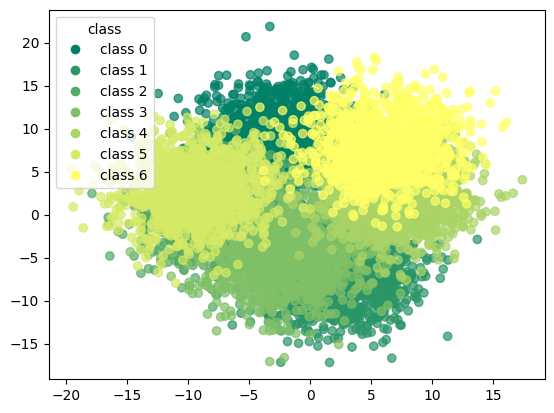

In [154]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

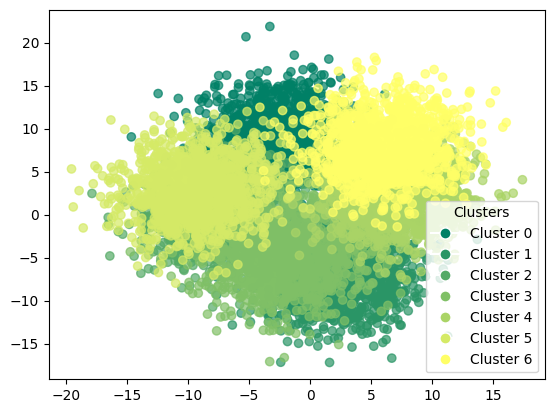

In [155]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

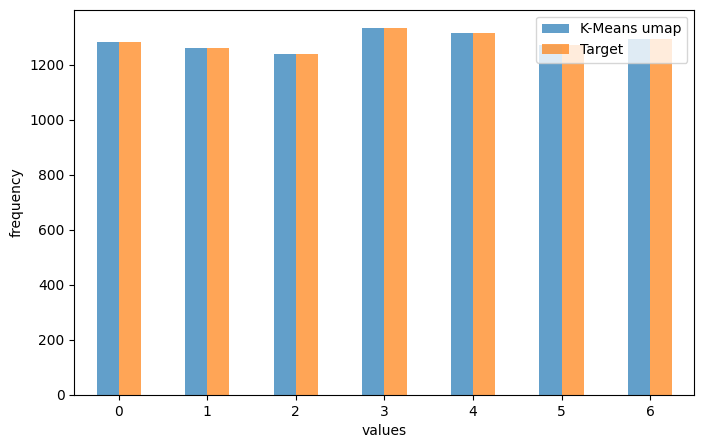

In [156]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [157]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1284    0    0    0    0    0    0]
 [   0 1260    0    0    0    0    0]
 [   0    0 1240    0    0    0    0]
 [   0    0    0 1333    0    0    0]
 [   0    0    0    0 1314    0    0]
 [   0    0    0    0    0 1270    0]
 [   0    0    0    0    0    0 1295]]


In [158]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1284
           1       1.00      1.00      1.00      1260
           2       1.00      1.00      1.00      1240
           3       1.00      1.00      1.00      1333
           4       1.00      1.00      1.00      1314
           5       1.00      1.00      1.00      1270
           6       1.00      1.00      1.00      1295

    accuracy                           1.00      8996
   macro avg       1.00      1.00      1.00      8996
weighted avg       1.00      1.00      1.00      8996



## dbscan

In [159]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

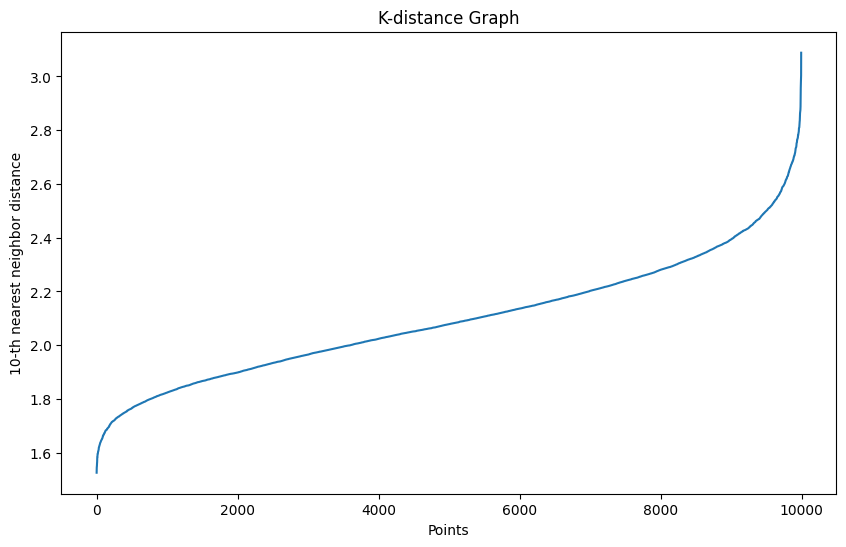

In [160]:
plot_k_distance_graph(X_values,k=10) 

In [161]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [162]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [163]:
df_dbscan = corr_dataset.copy()

In [164]:
df_dbscan['dbscan'] = dbscan.labels_

In [165]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [166]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,-1
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,-1
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,-1
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,-1
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,-1
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,-1
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,-1
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,-1


In [167]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    9996
Name: count, dtype: int64


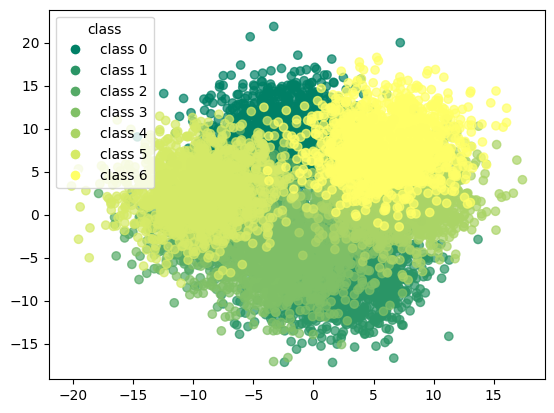

In [168]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

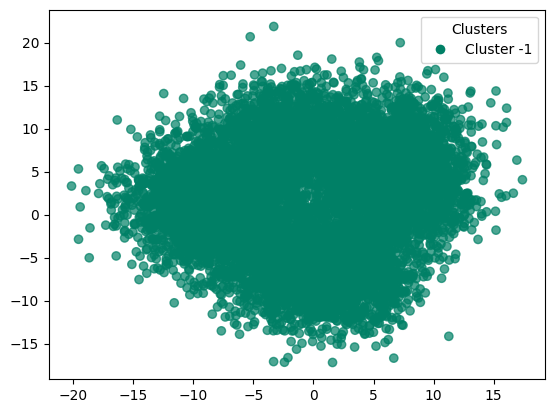

In [169]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [170]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]]


In [171]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1428.0
           1       0.00      0.00      0.00    1428.0
           2       0.00      0.00      0.00    1428.0
           3       0.00      0.00      0.00    1428.0
           4       0.00      0.00      0.00    1428.0
           5       0.00      0.00      0.00    1428.0
           6       0.00      0.00      0.00    1428.0

    accuracy                           0.00    9996.0
   macro avg       0.00      0.00      0.00    9996.0
weighted avg       0.00      0.00      0.00    9996.0



### dbscan with pca

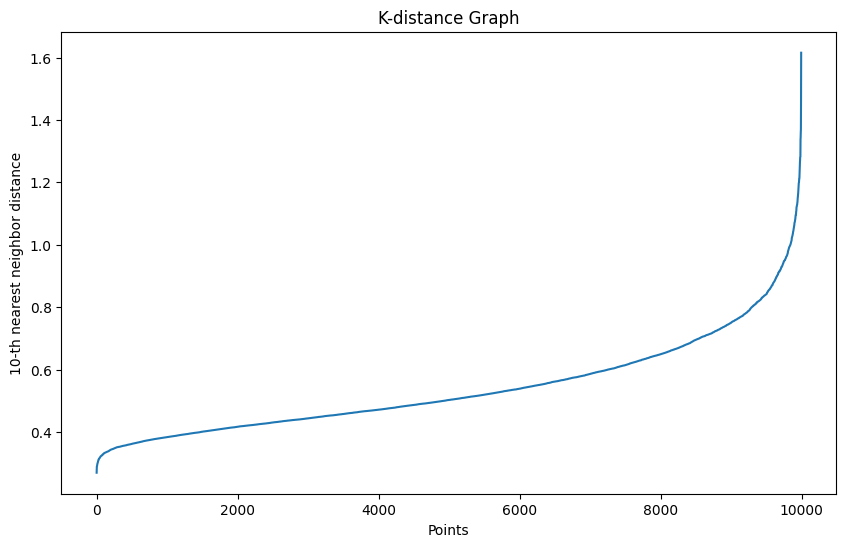

In [172]:
plot_k_distance_graph(X_pca,k=10)

In [173]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [174]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [175]:
df_pca_dbscan = corr_dataset.copy()

In [176]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [177]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.04721888755502201
accuracy after: 0.0


In [178]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,-1
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,-1
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,-1
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,18
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,18
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,18
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,-1


In [179]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
-1     6365
 17     564
 13     544
 18     530
 9      501
 2      472
 15     465
 0      458
 10      14
 3       14
 8       12
 4       12
 16      10
 1        8
 11       7
 14       6
 6        6
 12       4
 5        4
Name: count, dtype: int64


In [180]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [948   0   8 472   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [958 458   0   0   0   0   0   0  12   0   0   0   0   0   0   0   0   0
    0]
 [888   0   0   0  14   0   0   0   0 501  14   7   4   0   0   0   0   0
    0]
 [866   0   0   0   0  12   0   0   0   0   0   0   0 544   6   0   0   0
    0]
 [949   0   0   0   0   0   4   0   0   0   0   0   0   0   0 465  10   0
    0]
 [858   0   0   0   0   0   0   6   0   0   0   0   0   0   0   0   0 564
    0]
 [898   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
  530]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   

In [181]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1428.0
           1       0.00      0.00      0.00    1428.0
           2       0.00      0.00      0.00    1428.0
           3       0.00      0.00      0.00    1428.0
           4       0.00      0.00      0.00    1428.0
           5       0.00      0.00      0.00    1428.0
           6       0.00      0.00      0.00    1428.0
           8       0.00      0.00      0.00       0.0
           9       0.00      0.00      0.00       0.0
          10       0.00      0.00      0.00       0.0
          11       0.00      0.00      0.00       0.0
          12       0.00      0.00      0.00       0.0
          13       0.00      0.00      0.00       0.0
          14       0.00      0.00      0.00       0.0
          15       0.00      0.00      0.00       0.0
          16       0.00      0.00      0.00       0.0
          17       0.00    

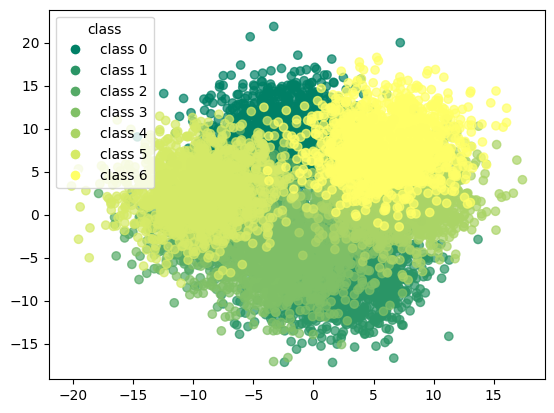

In [182]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

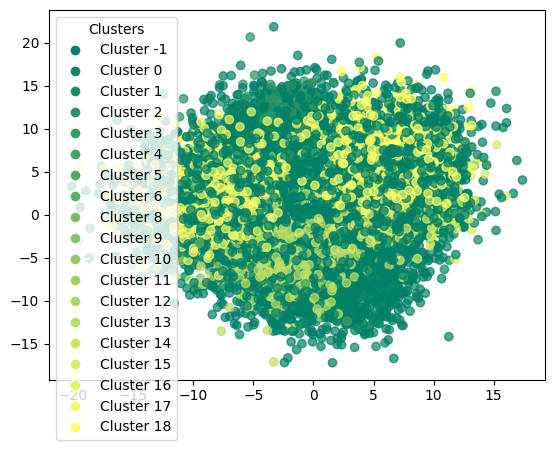

In [183]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

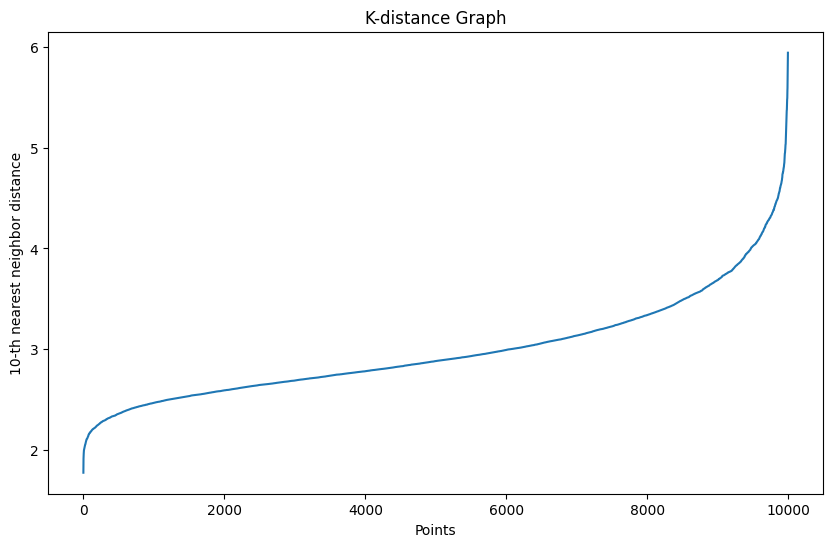

In [184]:
plot_k_distance_graph(X_tsne,k=10)

In [185]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [186]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [187]:
df_tsne_dbscan = corr_dataset.copy()

In [188]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [189]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.12685074029611845
accuracy after: 0.12685074029611845


In [190]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,19
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,19
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,19
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,19


In [191]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
 9     1303
 18    1280
 10    1270
 0     1268
 19    1264
 11    1262
 14    1250
-1      984
 5       13
 8       12
 3       11
 7       10
 17       9
 20       9
 16       8
 1        8
 12       8
 15       7
 2        7
 6        5
 13       4
 4        4
Name: count, dtype: int64


In [192]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0]
 [ 140 1268    8    0    0    0    0    0    0   12    0    0    0    0
     0    0    0    0    0    0    0    0]
 [ 118    0    0    7    0    0    0    0    0    0 1303    0    0    0
     0    0    0    0    0    0    0    0]
 [ 147    0    0    0   11    0    0    0    0    0    0 1270    0    0
     0    0    0    0    0    0    0    0]
 [ 150    0    0    0    0    4    0    0    0    0    0    0 1262    8
     4    0    0    0    0    0    0    0]
 [ 141    0    0    0    0    0   13    0    0    0    0    0    0    0
     0 1250    7    8    9    0    0    0]
 [ 143    0    0    0    0    0    0    5    0    0    0    0    0    0
     0    0    0    0    0 1280    0    0]
 [ 145    0    0    0    0    0    0    0   10    0    0    0    0    0
     0    0    0    0    0    0 1264    9]
 [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0  

In [193]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.89      0.94      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.00      0.00      0.00      1428
           4       0.00      0.00      0.00      1428
           5       0.00      0.00      0.00      1428
           6       0.00      0.00      0.00      1428
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

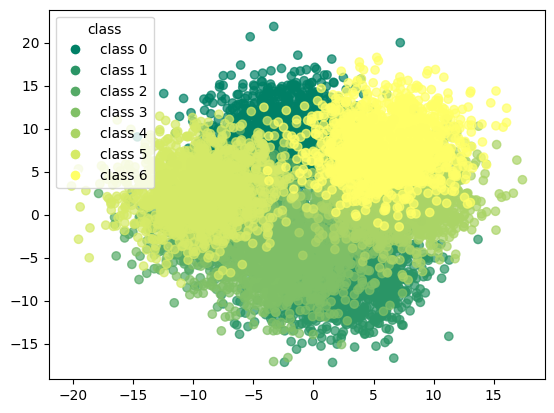

In [194]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

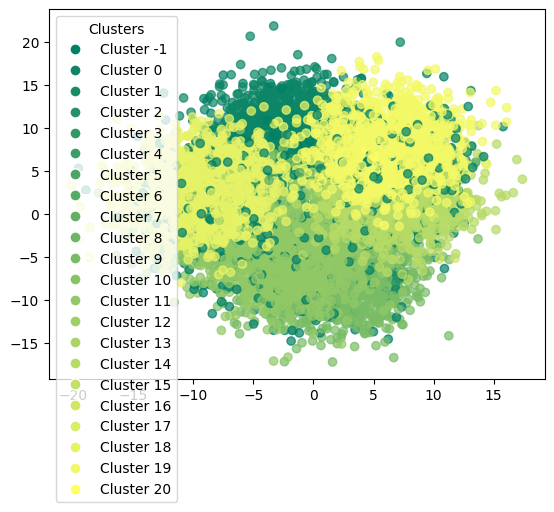

In [195]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

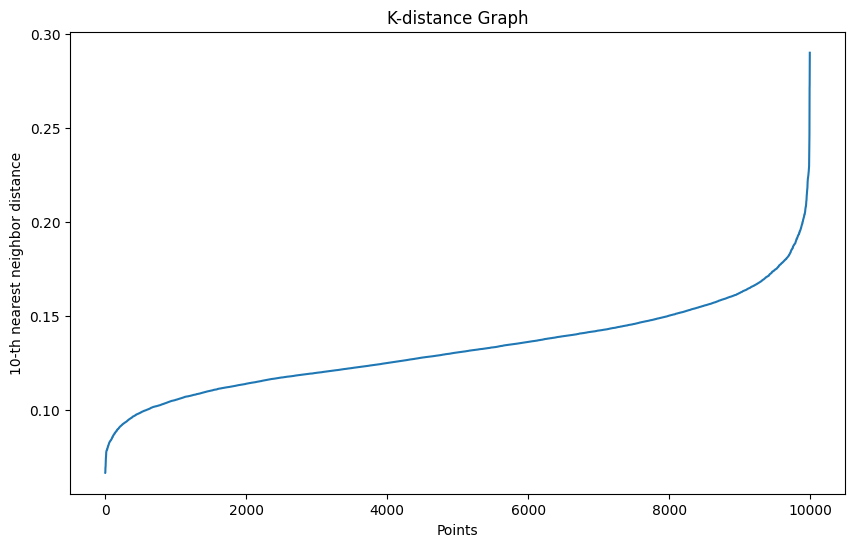

In [196]:
plot_k_distance_graph(X_umap,k=10)

In [197]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [198]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [199]:
df_umap_dbscan = corr_dataset.copy()

In [200]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [201]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 1.0
accuracy after: 1.0


In [202]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


In [203]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
0    1428
1    1428
2    1428
3    1428
4    1428
5    1428
6    1428
Name: count, dtype: int64


In [204]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [205]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



## GMM - Gaussian Mixture Models

In [206]:
gmm = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [207]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [208]:
df_gmm = corr_dataset.copy()

In [209]:
df_gmm['gmm'] = gmm.predict(X_values)

In [210]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,1
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,1
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,1
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,1


In [211]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


In [212]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


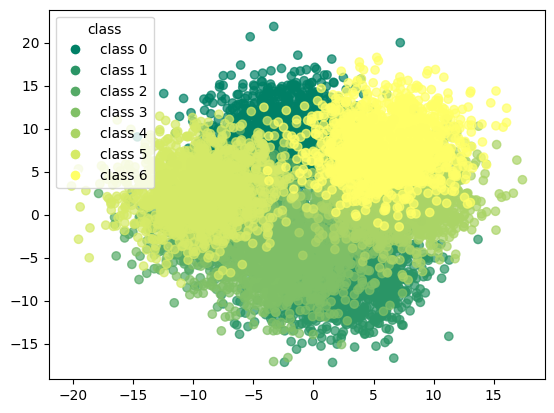

In [213]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

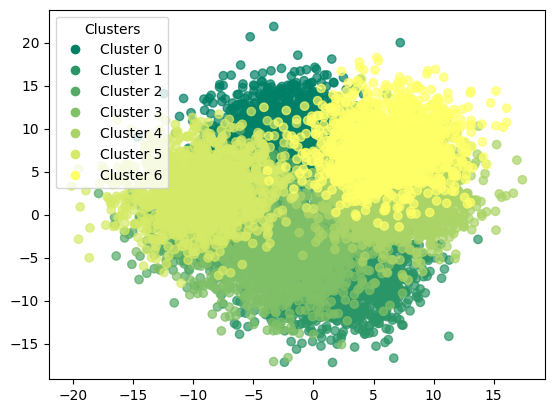

In [214]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [215]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [216]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### GMM with pca

In [217]:
gmm_pca = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [218]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [219]:
df_pca_gmm = corr_dataset.copy()

In [220]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [221]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,4
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,4
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,4
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,4


In [222]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


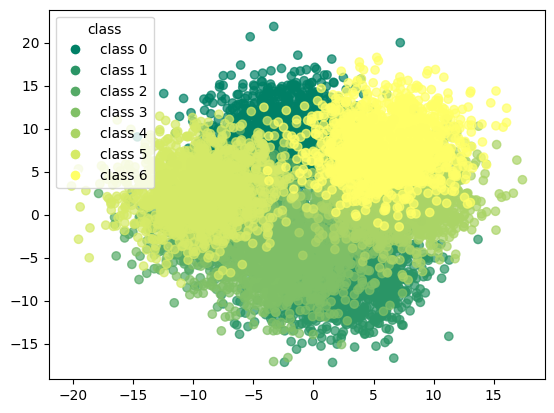

In [223]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

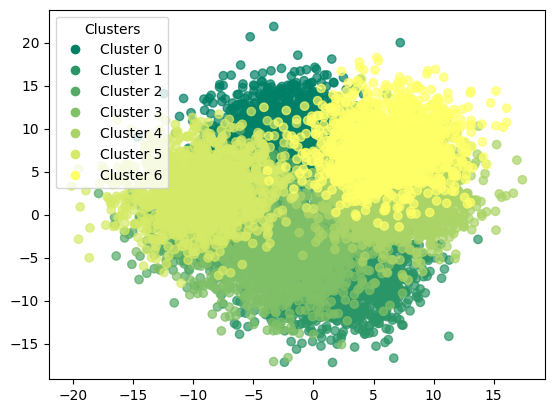

In [224]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [225]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [226]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### GMM with t-SNE

In [227]:
gmm_tsne = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [228]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [229]:
df_tsne_gmm = corr_dataset.copy()

In [230]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [231]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,1
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,1
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,1
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,1


In [232]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 1.0


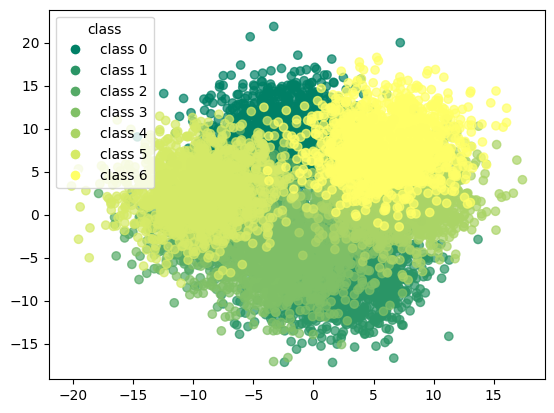

In [233]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

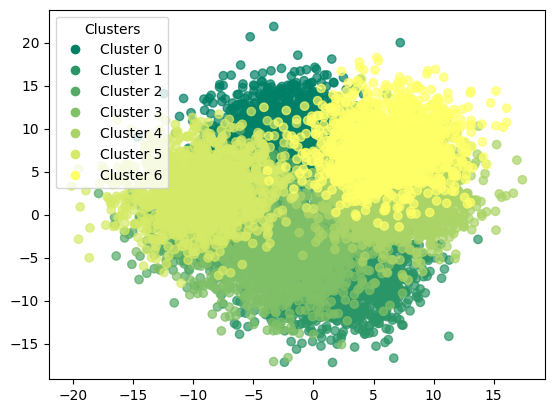

In [234]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [235]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [236]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### GMM with umap

In [237]:
gmm_umap = GaussianMixture(n_components=7,init_params='k-means++',random_state=42)

In [238]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=7, random_state=42)

In [239]:
df_umap_gmm = corr_dataset.copy()

In [240]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [241]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,3
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,3
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,3
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,3


In [242]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


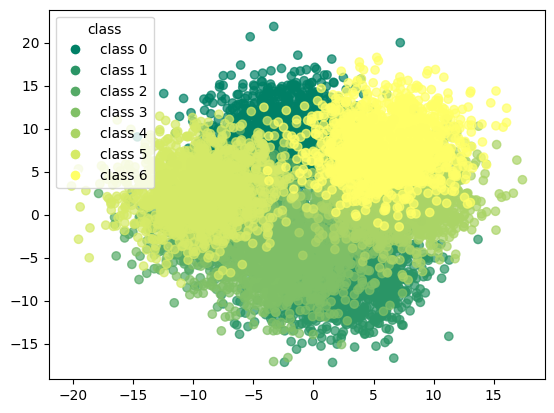

In [243]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

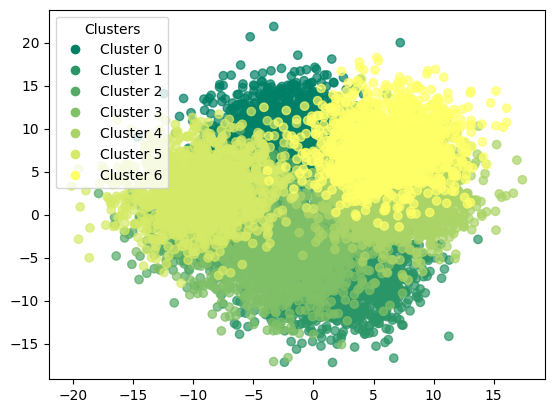

In [244]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [245]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [246]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



## pam

In [247]:
initial_medoids = np.random.choice(len(X_values),7,replace=False)

In [248]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [249]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [250]:
pam.process()

In [251]:
clusters = pam.get_clusters()

In [252]:
medoids = pam.get_medoids()

In [253]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [254]:
df_pam = corr_dataset.copy()

In [255]:
df_pam['pam'] = labels

In [256]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,2.0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,2.0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,2.0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,2.0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,4.0
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,4.0
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,4.0
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,4.0


In [257]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


In [258]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


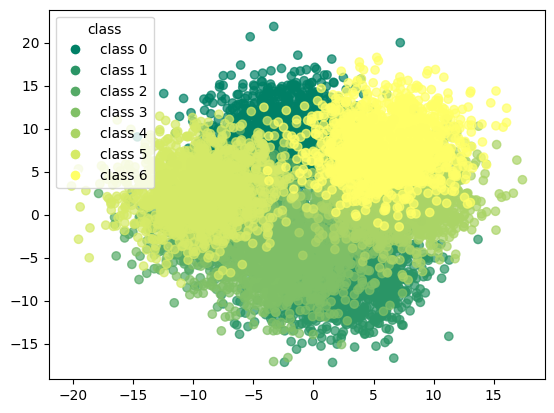

In [259]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

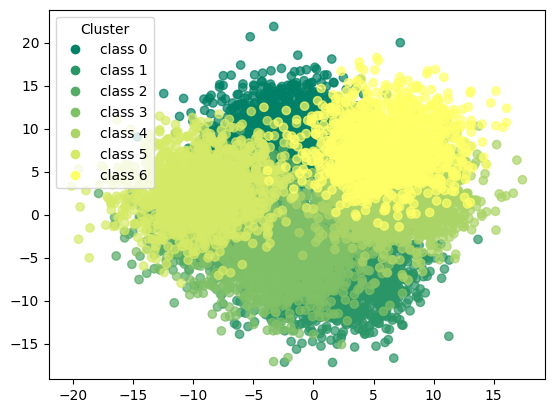

In [260]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [261]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [262]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### pam with pca

In [263]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [264]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [265]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [266]:
pam_pca.process()

In [267]:
clusters = pam_pca.get_clusters()

In [268]:
medoids = pam_pca.get_medoids()

In [269]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [270]:
df_pam_pca = corr_dataset.copy()

In [271]:
df_pam_pca['pam_pca'] = labels

In [272]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,3.0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,3.0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,3.0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,3.0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,0.0
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,0.0
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,0.0
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,0.0


In [273]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


In [274]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


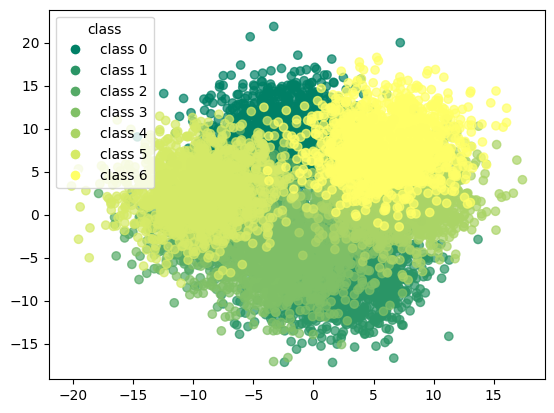

In [275]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

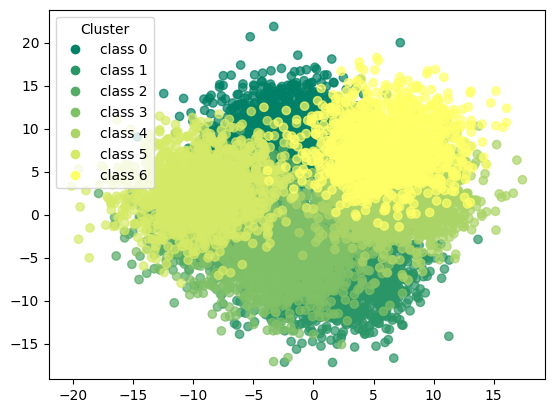

In [276]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [277]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [278]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### pam with t-SNE

In [279]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [280]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [281]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [282]:
pam_tsne.process()

In [283]:
clusters = pam_tsne.get_clusters()

In [284]:
medoids = pam_tsne.get_medoids()

In [285]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [286]:
df_pam_tsne = corr_dataset.copy()

In [287]:
df_pam_tsne['pam_tsne'] = labels

In [288]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,3.0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,3.0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,3.0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,3.0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,5.0
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,5.0
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,5.0
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,5.0


In [289]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.42767106842737096
accuracy after: 0.9990996398559424


In [290]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


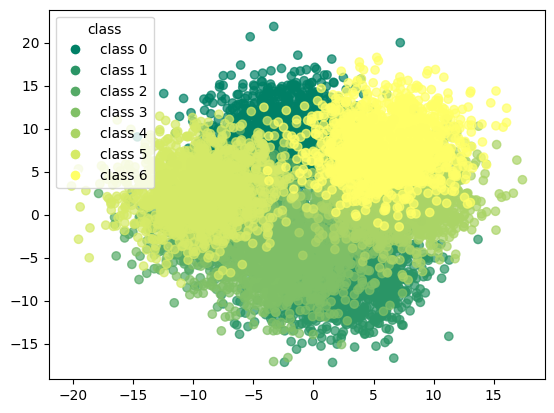

In [291]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

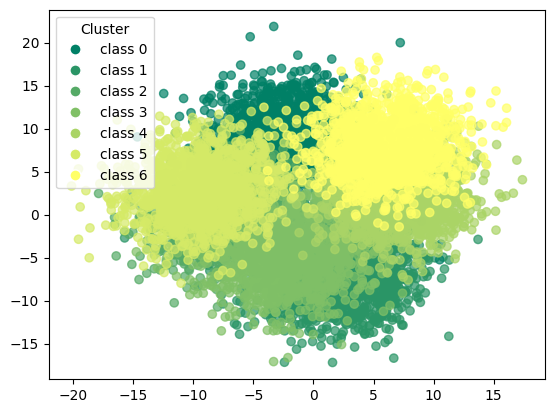

In [292]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [293]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    8 1420    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   1    0    0    0 1427    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [294]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       0.99      1.00      1.00      1428
           2       1.00      0.99      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



### pam with umap

In [295]:
initial_medoids = np.random.choice(len(X_pca),7,replace=False)

In [296]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [297]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [298]:
pam_umap.process()

In [299]:
clusters = pam_umap.get_clusters()

In [300]:
medoids = pam_umap.get_medoids()

In [301]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [302]:
df_pam_umap = corr_dataset.copy()

In [303]:
df_pam_umap['pam_umap'] = labels

In [304]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,3.0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,3.0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,3.0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,3.0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,1.0
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,1.0
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,1.0
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,1.0


In [305]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.14285714285714285
accuracy after: 1.0


In [306]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-2.171671,2.682197,9.714375,-4.482724,-5.103176,-8.568044,-15.034961,2.953496,0.129347,2.878672,...,7.900783,-13.783752,-7.313647,-4.340247,-5.793479,-3.192824,-4.981092,-8.741530,0,0
1,-7.798764,15.122212,1.687897,-0.048564,-11.594276,-0.115440,-7.345957,9.194082,0.694514,4.199702,...,10.408782,-6.869541,-5.195463,-8.142041,-6.671335,-3.182921,-4.134162,-9.388257,0,0
2,-0.895041,8.666468,0.097327,-1.774568,-11.744797,-3.524622,-6.238153,9.447539,4.138841,4.614474,...,5.820778,-4.532934,-4.016638,-7.737308,-7.486448,0.721619,-1.218700,-3.560841,0,0
3,-4.300618,10.044553,8.545179,4.643088,-3.064936,-5.692647,-8.900119,4.384275,1.795706,5.252450,...,4.321492,-3.396161,-7.440081,-9.623141,-1.682470,2.507059,2.011017,-7.104032,0,0
4,2.541242,8.981844,1.047273,-2.249743,-7.882464,-11.623685,-7.432165,8.423674,2.367222,2.290568,...,7.236077,-4.693318,-7.259099,-10.064025,-0.843601,-1.226747,-1.150286,-2.262662,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9991,8.695856,10.009426,-3.595757,-8.828578,-1.107317,5.272230,6.605865,10.637978,-7.728037,4.542768,...,-5.145198,-8.335759,5.651803,-5.633574,2.484011,5.836591,-1.299808,5.518249,6,6
9992,9.391831,7.585353,1.811142,-1.658682,-4.563994,-2.292000,5.439184,4.198914,-6.963580,-1.435736,...,-14.637143,-2.306423,10.954658,1.468030,-4.475381,7.238502,1.083725,11.493779,6,6
9993,7.755284,13.479813,2.262127,-9.996846,-6.621559,-3.497036,6.341176,11.305120,-11.985708,-3.372057,...,-5.259920,0.241091,13.986038,-1.596883,0.051808,3.129198,-2.306746,13.013456,6,6
9994,6.502393,7.245824,-0.897400,-3.468539,-2.952947,1.571032,1.432251,10.281573,-11.489924,-2.198457,...,-6.426054,-4.591075,2.937224,-4.269551,-1.176548,-3.038940,-8.268633,7.592937,6,6


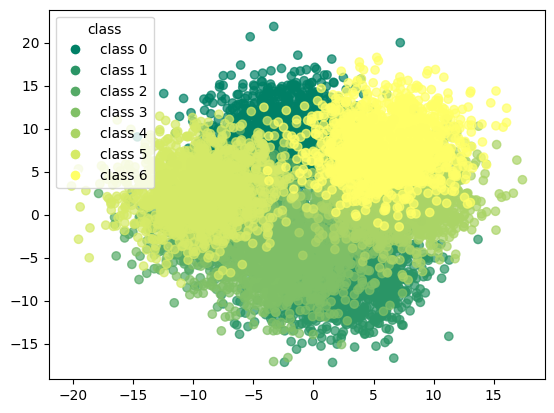

In [307]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

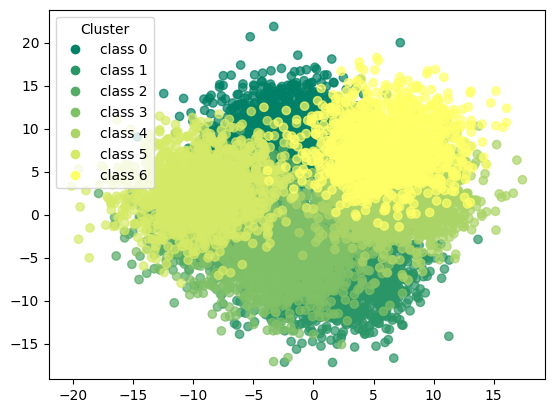

In [308]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [309]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [310]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



# overall results k-means

## basic

In [311]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [312]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


## + pca

In [313]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [314]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


## + t-SNE

In [315]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [316]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    4 1424    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   2    0    0    0 1426    0    0]
 [   0    1    0    0    0 1427    0]
 [   0    0    0    0    0    0 1428]]


## + UMAP

In [317]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [318]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


# overall results trimmed k-means

## basic

In [319]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1296
           1       1.00      1.00      1.00      1270
           2       1.00      1.00      1.00      1283
           3       1.00      1.00      1.00      1282
           4       1.00      1.00      1.00      1284
           5       1.00      1.00      1.00      1292
           6       1.00      1.00      1.00      1289

    accuracy                           1.00      8996
   macro avg       1.00      1.00      1.00      8996
weighted avg       1.00      1.00      1.00      8996



In [320]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[1296    0    0    0    0    0    0]
 [   0 1270    0    0    0    0    0]
 [   0    0 1283    0    0    0    0]
 [   0    0    0 1282    0    0    0]
 [   0    0    0    0 1284    0    0]
 [   0    0    0    0    0 1292    0]
 [   0    0    0    0    0    0 1289]]


## + pca

In [321]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1296
           1       0.98      1.00      0.99      1270
           2       0.99      0.99      0.99      1283
           3       0.99      0.99      0.99      1282
           4       1.00      0.99      0.99      1284
           5       0.99      1.00      0.99      1292
           6       1.00      0.99      1.00      1289

    accuracy                           0.99      8996
   macro avg       0.99      0.99      0.99      8996
weighted avg       0.99      0.99      0.99      8996



In [322]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[1281   15    0    0    0    0    0]
 [   0 1270    0    0    0    0    0]
 [   0    8 1275    0    0    0    0]
 [   0    0   18 1264    0    0    0]
 [   0    0    0   12 1268    4    0]
 [   0    0    0    0    0 1292    0]
 [   0    0    0    0    0   11 1278]]


## + t-SNE

In [323]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1296
           1       0.96      0.99      0.97      1270
           2       0.98      0.96      0.97      1283
           3       0.97      0.98      0.97      1282
           4       0.97      0.96      0.97      1284
           5       0.99      0.97      0.98      1292
           6       1.00      0.99      0.99      1289

    accuracy                           0.98      8996
   macro avg       0.98      0.98      0.98      8996
weighted avg       0.98      0.98      0.98      8996



In [324]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[1296    0    0    0    0    0    0]
 [  14 1256    0    0    0    0    0]
 [   0   55 1228    0    0    0    0]
 [   0    0   28 1254    0    0    0]
 [   0    0    0   45 1239    0    0]
 [   0    0    0    0   33 1259    0]
 [   0    0    0    0    0   13 1276]]


## + UMAP

In [325]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1284
           1       1.00      1.00      1.00      1260
           2       1.00      1.00      1.00      1240
           3       1.00      1.00      1.00      1333
           4       1.00      1.00      1.00      1314
           5       1.00      1.00      1.00      1270
           6       1.00      1.00      1.00      1295

    accuracy                           1.00      8996
   macro avg       1.00      1.00      1.00      8996
weighted avg       1.00      1.00      1.00      8996



In [326]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1284    0    0    0    0    0    0]
 [   0 1260    0    0    0    0    0]
 [   0    0 1240    0    0    0    0]
 [   0    0    0 1333    0    0    0]
 [   0    0    0    0 1314    0    0]
 [   0    0    0    0    0 1270    0]
 [   0    0    0    0    0    0 1295]]


# overall results dbscan

## basic

In [327]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1428.0
           1       0.00      0.00      0.00    1428.0
           2       0.00      0.00      0.00    1428.0
           3       0.00      0.00      0.00    1428.0
           4       0.00      0.00      0.00    1428.0
           5       0.00      0.00      0.00    1428.0
           6       0.00      0.00      0.00    1428.0

    accuracy                           0.00    9996.0
   macro avg       0.00      0.00      0.00    9996.0
weighted avg       0.00      0.00      0.00    9996.0



In [328]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]
 [1428    0    0    0    0    0    0    0]]


## + pca

In [329]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    1428.0
           1       0.00      0.00      0.00    1428.0
           2       0.00      0.00      0.00    1428.0
           3       0.00      0.00      0.00    1428.0
           4       0.00      0.00      0.00    1428.0
           5       0.00      0.00      0.00    1428.0
           6       0.00      0.00      0.00    1428.0
           8       0.00      0.00      0.00       0.0
           9       0.00      0.00      0.00       0.0
          10       0.00      0.00      0.00       0.0
          11       0.00      0.00      0.00       0.0
          12       0.00      0.00      0.00       0.0
          13       0.00      0.00      0.00       0.0
          14       0.00      0.00      0.00       0.0
          15       0.00      0.00      0.00       0.0
          16       0.00      0.00      0.00       0.0
          17       0.00    

In [330]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [948   0   8 472   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [958 458   0   0   0   0   0   0  12   0   0   0   0   0   0   0   0   0
    0]
 [888   0   0   0  14   0   0   0   0 501  14   7   4   0   0   0   0   0
    0]
 [866   0   0   0   0  12   0   0   0   0   0   0   0 544   6   0   0   0
    0]
 [949   0   0   0   0   0   4   0   0   0   0   0   0   0   0 465  10   0
    0]
 [858   0   0   0   0   0   0   6   0   0   0   0   0   0   0   0   0 564
    0]
 [898   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
  530]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0]
 [  0   0   0   0   0   0   

## + t-SNE

In [331]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.89      0.94      1428
           1       0.00      0.00      0.00      1428
           2       0.00      0.00      0.00      1428
           3       0.00      0.00      0.00      1428
           4       0.00      0.00      0.00      1428
           5       0.00      0.00      0.00      1428
           6       0.00      0.00      0.00      1428
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [332]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0]
 [ 140 1268    8    0    0    0    0    0    0   12    0    0    0    0
     0    0    0    0    0    0    0    0]
 [ 118    0    0    7    0    0    0    0    0    0 1303    0    0    0
     0    0    0    0    0    0    0    0]
 [ 147    0    0    0   11    0    0    0    0    0    0 1270    0    0
     0    0    0    0    0    0    0    0]
 [ 150    0    0    0    0    4    0    0    0    0    0    0 1262    8
     4    0    0    0    0    0    0    0]
 [ 141    0    0    0    0    0   13    0    0    0    0    0    0    0
     0 1250    7    8    9    0    0    0]
 [ 143    0    0    0    0    0    0    5    0    0    0    0    0    0
     0    0    0    0    0 1280    0    0]
 [ 145    0    0    0    0    0    0    0   10    0    0    0    0    0
     0    0    0    0    0    0 1264    9]
 [   0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0  

## + UMAP

In [333]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [334]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


# overall results GMM

## basic

In [335]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [336]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


## + pca

In [337]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [338]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


## + t-SNE

In [339]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [340]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


## + UMAP

In [341]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



In [342]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


# overall results pam

## basic

In [343]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [344]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



## + pca

In [345]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [346]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



## + t-SNE

In [347]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    8 1420    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   1    0    0    0 1427    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [348]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       0.99      1.00      1.00      1428
           2       1.00      0.99      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996



## + umap

In [349]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[1428    0    0    0    0    0    0]
 [   0 1428    0    0    0    0    0]
 [   0    0 1428    0    0    0    0]
 [   0    0    0 1428    0    0    0]
 [   0    0    0    0 1428    0    0]
 [   0    0    0    0    0 1428    0]
 [   0    0    0    0    0    0 1428]]


In [350]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1428
           1       1.00      1.00      1.00      1428
           2       1.00      1.00      1.00      1428
           3       1.00      1.00      1.00      1428
           4       1.00      1.00      1.00      1428
           5       1.00      1.00      1.00      1428
           6       1.00      1.00      1.00      1428

    accuracy                           1.00      9996
   macro avg       1.00      1.00      1.00      9996
weighted avg       1.00      1.00      1.00      9996

